In [40]:
import os
import numpy as np
import pandas as pd
import networkx as nx
from collections import Counter

import time
from node2vec import Node2Vec

# **1. Cargamos los datos**

In [2]:
files = os.listdir("data/kg")
files

['groups.csv',
 'professionals.csv',
 'tag_questions.csv',
 'emails.csv',
 'answers.csv',
 'group_memberships.csv',
 'tag_users.csv',
 'matches.csv',
 'answer_scores.csv',
 'tags.csv',
 'comments.csv',
 'questions.csv',
 'school_memberships.csv',
 'question_scores.csv',
 'students.csv']

In [10]:
grp_df = pd.read_csv("data/kg/groups.csv")
grp_df.head()

,groups_id,groups_group_type
0,eabbdf4029734c848a9da20779637d03,youth program
1,7080bf8dcf78463bb03e6863887fd715,youth program
2,bc6fc50a2b444efc8ec47111b290ffb8,youth program
3,37f002e8d5e442ca8e36e972eaa55882,youth program
4,52419ff84d4b47bebd0b0a6c1263c296,youth program


In [14]:
grp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   groups_id          49 non-null     object
 1   groups_group_type  49 non-null     object
dtypes: object(2)
memory usage: 912.0+ bytes


In [12]:
set(grp_df["groups_group_type"])

{'cause',
 'club',
 'competition',
 'interest group',
 'mentorship program',
 'professional network',
 'youth program'}

In [4]:
data_parts = {}
for file_name in files:
    file_id = file_name.split(".")[0]
    data_parts[file_id] = pd.read_csv("data/kg/" + file_name)
    print(file_id)
    print(data_parts[file_id].shape)

groups
(49, 2)
professionals
(28152, 5)
tag_questions
(76553, 2)
emails
(1850101, 4)
answers
(51123, 5)
group_memberships
(1038, 2)
tag_users
(136663, 2)
matches
(4316275, 2)
answer_scores
(51138, 2)
tags
(16269, 2)
comments
(14966, 5)
questions
(23931, 5)
school_memberships
(5638, 2)
question_scores
(23928, 2)
students
(30971, 3)


# **2. Construcción del Grafo de Conocimiento** a partir de los datos CarrerVillage

In [16]:
def add_nodes(G, df, col, type_name):
    """Add entities to G from the 'col' column of the 'df' DataFrame. The new nodes are annotated with 'type_name' label."""
    nodes = list(df[~df[col].isnull()][col].unique())
    G.add_nodes_from([(n,dict(type=type_name)) for n in nodes])
    print("Nodes (%s,%s) were added" % (col, type_name))
    
def add_links(G, df, col1, col2, type_name):
    """Add links to G from the 'df' DataFrame. The new edges are annotated with 'type_name' label."""
    df_tmp = df[(~df[col1].isnull()) & (~df[col2].isnull())]
    links = list(zip(df_tmp[col1],df_tmp[col2]))
    G.add_edges_from([(src, trg, dict(type=type_name)) for src, trg in links])
    print("Edges (%s -> %s,%s) were added" % (col1, col2, type_name))

In [6]:
G = nx.DiGraph()

### **Nodos (del grafo de conocimiento)**

- answers
- questions
- comments
- students
- professionals
- industries
- schools
- tags
- user groups
- group types

In [7]:
add_nodes(G, data_parts["answers"], "answers_id", "answer")
add_nodes(G, data_parts["comments"], "comments_id", "comment")
add_nodes(G, data_parts["groups"], "groups_id", "group")
add_nodes(G, data_parts["groups"], "groups_group_type", "group_type")
add_nodes(G, data_parts["professionals"], "professionals_id", "professional")
add_nodes(G, data_parts["professionals"], "professionals_industry", "industry")
add_nodes(G, data_parts["questions"], "questions_id", "question")
add_nodes(G, data_parts["school_memberships"], "school_memberships_school_id", "school")
add_nodes(G, data_parts["students"], "students_id", "student")
add_nodes(G, data_parts["tags"], "tags_tag_id", "tag")

Nodes (answers_id,answer) were added
Nodes (comments_id,comment) were added
Nodes (groups_id,group) were added
Nodes (groups_group_type,group_type) were added
Nodes (professionals_id,professional) were added
Nodes (professionals_industry,industry) were added
Nodes (questions_id,question) were added
Nodes (school_memberships_school_id,school) were added
Nodes (students_id,student) were added
Nodes (tags_tag_id,tag) were added


### **Vertices (del grafo de conocimiento)**


In [17]:
add_links(G, data_parts["answers"], "answers_id", "answers_question_id", "question")
add_links(G, data_parts["answers"], "answers_id", "answers_author_id", "author")
add_links(G, data_parts["comments"], "comments_id", "comments_parent_content_id", "parent_content")
add_links(G, data_parts["comments"], "comments_id", "comments_author_id", "author")
add_links(G, data_parts["group_memberships"], "group_memberships_user_id", "group_memberships_group_id", "member")
add_links(G, data_parts["groups"], "groups_id", "groups_group_type", "type")
add_links(G, data_parts["professionals"], "professionals_id", "professionals_industry", "type")
add_links(G, data_parts["questions"], "questions_id", "questions_author_id", "author")
add_links(G, data_parts["school_memberships"], "school_memberships_user_id", "school_memberships_school_id", "member")
add_links(G, data_parts["tag_questions"], "tag_questions_question_id", "tag_questions_tag_id", "tag")
add_links(G, data_parts["tag_users"], "tag_users_user_id", "tag_users_tag_id", "follow")

Edges (answers_id -> answers_question_id,question) were added
Edges (answers_id -> answers_author_id,author) were added
Edges (comments_id -> comments_parent_content_id,parent_content) were added
Edges (comments_id -> comments_author_id,author) were added
Edges (group_memberships_user_id -> group_memberships_group_id,member) were added
Edges (groups_id -> groups_group_type,type) were added
Edges (professionals_id -> professionals_industry,type) were added
Edges (questions_id -> questions_author_id,author) were added
Edges (school_memberships_user_id -> school_memberships_school_id,member) were added
Edges (tag_questions_question_id -> tag_questions_tag_id,tag) were added
Edges (tag_users_user_id -> tag_users_tag_id,follow) were added


### **Información de Ubicación**

La información de ubicación de los usuarios y profesionales se preprocesa antes de añadirla al grafo de conocimiento. Extraemos la jerarquía de ciudad / estado / país de las ubicaciones proporcionadas en los datos. Creamos diferentes niveles para las ubicaciones: ciudades, estados/regiones y países.

In [18]:
students = data_parts["students"]
profs = data_parts["professionals"]
students = students[~students["students_location"].isnull()]
profs = profs[~profs["professionals_location"].isnull()]

In [19]:
locs1 = list(students["students_location"])
locs2 = list(profs["professionals_location"])
locs = [loc.lower() for loc in locs1+locs2]
locs_unique = list(set(locs))

#### Lugares con mayor frecuencia:

In [20]:
cnt = Counter(locs)
cnt.most_common()[:10]

[('new york, new york', 2650),
 ('bengaluru, karnataka, india', 1284),
 ('los angeles, california', 1280),
 ('boston, massachusetts', 1271),
 ('houston, texas', 1032),
 ('san francisco, california', 975),
 ('chicago, illinois', 920),
 ('california, california', 894),
 ('greater new york city area', 745),
 ('atlanta, georgia', 738)]

#### Preprocesamiento de Información de Ubicación:

In [21]:
new_edges = []
new_nodes = []
for loc in locs_unique:
    loc_hierarchy = loc.split(", ")
    loc_nodes = [] # due to city name duplicates in the world
    k = len(loc_hierarchy)
    for i in range(k):
        loc_nodes.append('_'.join(loc_hierarchy[i:]))
    new_nodes += loc_nodes
    loc_links = [(loc_nodes[i],loc_nodes[i+1], dict(type="location"))  for i in range(k-1)]
    new_edges += loc_links
new_nodes = list(set(new_nodes))
new_nodes = [(n, dict(type="location")) for n in new_nodes]

#### Añadimos los Nodos de Ubicación al Grafo

- Añadimos los 3 nivels de nodos
- Añadimos conexiones entre ciudades -> regiones; regiones -> países

In [22]:
G.add_nodes_from(new_nodes)
G.add_edges_from(new_edges)
print(len(new_edges), len(new_nodes))

7253 7160


#### Ejemplo:

In [23]:
list(G.in_edges("united kingdom"))[:5]

[('england_united kingdom', 'united kingdom'),
 ('scotland_united kingdom', 'united kingdom'),
 ('newcastle upon tyne_united kingdom', 'united kingdom'),
 ('kingston upon thames_united kingdom', 'united kingdom'),
 ('wales_united kingdom', 'united kingdom')]

In [24]:
list(G.in_edges("england_united kingdom"))[:5]

[('bromsgrove_england_united kingdom', 'england_united kingdom'),
 ('liverpool_england_united kingdom', 'england_united kingdom'),
 ('belvedere_england_united kingdom', 'england_united kingdom'),
 ('colchester_england_united kingdom', 'england_united kingdom'),
 ('goole_england_united kingdom', 'england_united kingdom')]

In [25]:
students["students_location"] = students["students_location"].apply(lambda x: "_".join(x.lower().split(", ")))
profs["professionals_location"] = profs["professionals_location"].apply(lambda x: "_".join(x.lower().split(", ")))

/var/folders/3_/bsh490990pv6w7gjtmjv6qy80000gn/T/ipykernel_70077/1738426549.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  students["students_location"] = students["students_location"].apply(lambda x: "_".join(x.lower().split(", ")))
/var/folders/3_/bsh490990pv6w7gjtmjv6qy80000gn/T/ipykernel_70077/1738426549.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  profs["professionals_location"] = profs["professionals_location"].apply(lambda x: "_".join(x.lower().split(", ")))


In [26]:
add_links(G, students, "students_id", "students_location", "location")
add_links(G, profs, "professionals_id", "professionals_location", "location")

Edges (students_id -> students_location,location) were added
Edges (professionals_id -> professionals_location,location) were added


### **Limpiamos y Codificamos el Grafo de Conocimiento**

In [27]:
def encode_graph(G):
    """Encode the nodes of the network into integers"""
    nodes = [(n,d.get("type",None)) for n, d in G.nodes(data=True)]
    nodes_df = pd.DataFrame(nodes, columns=["id","type"]).reset_index()
    node2idx = dict(zip(nodes_df["id"],nodes_df["index"]))
    edges = [(node2idx[src], node2idx[trg], d.get("type",None)) for src, trg, d in G.edges(data=True)]
    edges_df = pd.DataFrame(edges, columns=["src","trg","type"])
    return nodes_df, edges_df

#### Eliminamos los nodos aislados

In [28]:
print(G.number_of_nodes(), G.number_of_edges())
G.remove_nodes_from(list(nx.isolates(G)))
print(G.number_of_nodes(), G.number_of_edges())

177889 461368
174180 461368


#### Codificamos los nodos que tengan identificadores enteros (integers)

In [29]:
nodes_df, edges_df = encode_graph(G)
len(nodes_df), len(edges_df)

(174180, 461368)

#### Resumen de información de nodos

In [30]:
print(nodes_df.head())
print(nodes_df["type"].value_counts())
nodes_df.to_csv("knowledge_graph_nodes.csv", index=False)

   index                                id    type
0      0  4e5f01128cae4f6d8fd697cec5dca60c  answer
1      1  ada720538c014e9b8a6dceed09385ee3  answer
2      2  eaa66ef919bc408ab5296237440e323f  answer
3      3  1a6b3749d391486c9e371fbd1e605014  answer
4      4  5229c514000446d582050f89ebd4e184  answer
type
answer          51123
student         29460
professional    27819
question        23931
comment         14966
tag             14404
location         7160
school           2706
industry         2469
group              49
group_type          7
Name: count, dtype: int64


#### Resumen de información de aristas

In [33]:
print(edges_df.head())
print(edges_df["type"].value_counts())
edges_df[["src","trg"]].to_csv("knowledge_graph_edges.csv", index=False, header=False, sep=" ")

   src    trg      type
0    0  96433  question
1    0  68352    author
2    1  96434  question
3    1  83417    author
4    2  96434  question
type
follow            135907
author             90020
tag                76553
location           60724
question           51123
type               25624
parent_content     14966
member              6451
Name: count, dtype: int64


# **3. Node2Vec**

In [34]:
edge_list = list(zip(edges_df["src"],edges_df["trg"]))
edge_list[:5]

[(0, 96433), (0, 68352), (1, 96434), (1, 83417), (2, 96434)]

In [35]:
KG = nx.Graph(edge_list)
KG.number_of_nodes(), KG.number_of_edges()

(174180, 461368)

In [36]:
largest_cc = max(nx.connected_components(KG), key=len)
KG = nx.subgraph(KG, largest_cc)
KG.number_of_nodes(), KG.number_of_edges()

(173932, 461224)

NOTA: Analizaremos solo el componente más grande (débilmente) conectado de nuestro grafo de conocimiento.

In [37]:
largest_cc = max(nx.connected_components(KG), key=len)
KG = nx.subgraph(KG, largest_cc)
KG.number_of_nodes(), KG.number_of_edges()

(173932, 461224)

### Implementamos `node2vec`

- Primero generamos caminos aleatorias comenzando desde cada nodo del grafo de conocimiento inicializando el objeto Node2Vec.
- Luego optimizamos las representaciones de los nodos con la función fit().

In [41]:
%%time
n2v_obj = Node2Vec(KG, dimensions=10, walk_length=5, num_walks=10, p=1, q=1, workers=1)

Computing transition probabilities:   0%|          | 0/173932 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████| 10/10 [02:23<00:00, 14.32s/it]

CPU times: user 30min, sys: 28.8 s, total: 30min 29s
Wall time: 34min 52s


In [42]:
%%time
n2v_model = n2v_obj.fit(window=3, min_count=1, batch_words=4)

CPU times: user 14min 6s, sys: 3min 27s, total: 17min 33s
Wall time: 15min 57s


# **4. Visualización de Incrustación de Nodos** (Node Embeddings)

Vamos a entrenar Node2Vec para mapear todos los nodos del grafo de conocimiento a un espacio de 10 dimensiones euclidianas. Para visualizar el resultado en 2 dimensiones utilizaremos el algoritmo de reducción de dimensionalidad `t-SNE`.

In [43]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def get_embeddings(model, nodes):
    """Extract representations from the node2vec model"""
    embeddings = [list(model.wv.get_vector(n)) for n in nodes]
    embeddings = np.array(embeddings)
    print(embeddings.shape)
    return embeddings

def dim_reduction(embeddings, labels, frac=None, tsne_obj=TSNE(n_components=2)):
    """Dimensionality reduction with t-SNE. Sampling random instances is supported."""
    N = len(embeddings)
    print(N)
    if frac != None:
        idx = np.random.randint(N, size=int(N*frac))
        X = embeddings[idx,:]
        X_labels = [labels[i] for i in idx]
    else:
        X = embeddings
        X_labels = labels
    X_embedded = tsne_obj.fit_transform(X)
    print("t-SNE object was trained on %i records!" % X.shape[0])
    print(X_embedded.shape)
    return X_embedded, X_labels

def visu_embeddings(X_embedded, X_labels=None, colors = ['r','b']):
    if X_labels != None:
        label_map = {}
        for i, l in enumerate(usr_tsne_lab):
            if not l in label_map:
                label_map[l] = []
            label_map[l].append(i)
        fig, ax = plt.subplots(figsize=(15,15))
        for i, lab in enumerate(label_map.keys()):
            print(lab)
            idx = label_map[lab]
            x = list(X_embedded[idx,0])
            y = list(X_embedded[idx,1])
            #print(len(x),len(y))
            ax.scatter(x, y, c=colors[i], label=lab, alpha=0.5, edgecolors='none')
        plt.legend()
    else:
        plt.figure(figsize=(15,15))
        x = list(X_embedded[:,0])
        y = list(X_embedded[:,1])
        plt.scatter(x, y, alpha=0.5)

In [44]:
stud_users = list(nodes_df[nodes_df["type"] == "student"]["index"])
prof_users = list(nodes_df[nodes_df["type"] == "professional"]["index"])
print(len(stud_users), len(prof_users))
stud_users = list(set(stud_users).intersection(set(KG.nodes())))
prof_users = list(set(prof_users).intersection(set(KG.nodes())))
print(len(stud_users), len(prof_users))
stud_users = [str(item) for item in stud_users]
prof_users = [str(item) for item in prof_users]

29460 27819
29378 27781


### a) Incrustación de usuarios con reducción de dimensionalidad `t-SNE`

In [45]:
users = stud_users + prof_users
usr_emb = get_embeddings(n2v_model, users)
usr_labs = ['student'] * len(stud_users) +  ['professional'] * len(prof_users)

(57159, 10)


#### Visualizamos de forma aleatoria solo el 50% de los usuarios simplemente por claridad

In [46]:
%%time
usr_tsne_emb, usr_tsne_lab = dim_reduction(usr_emb, usr_labs, frac=0.5)

57159
t-SNE object was trained on 28579 records!
(28579, 2)
CPU times: user 8min 46s, sys: 17.5 s, total: 9min 4s
Wall time: 1min 39s


professional
student


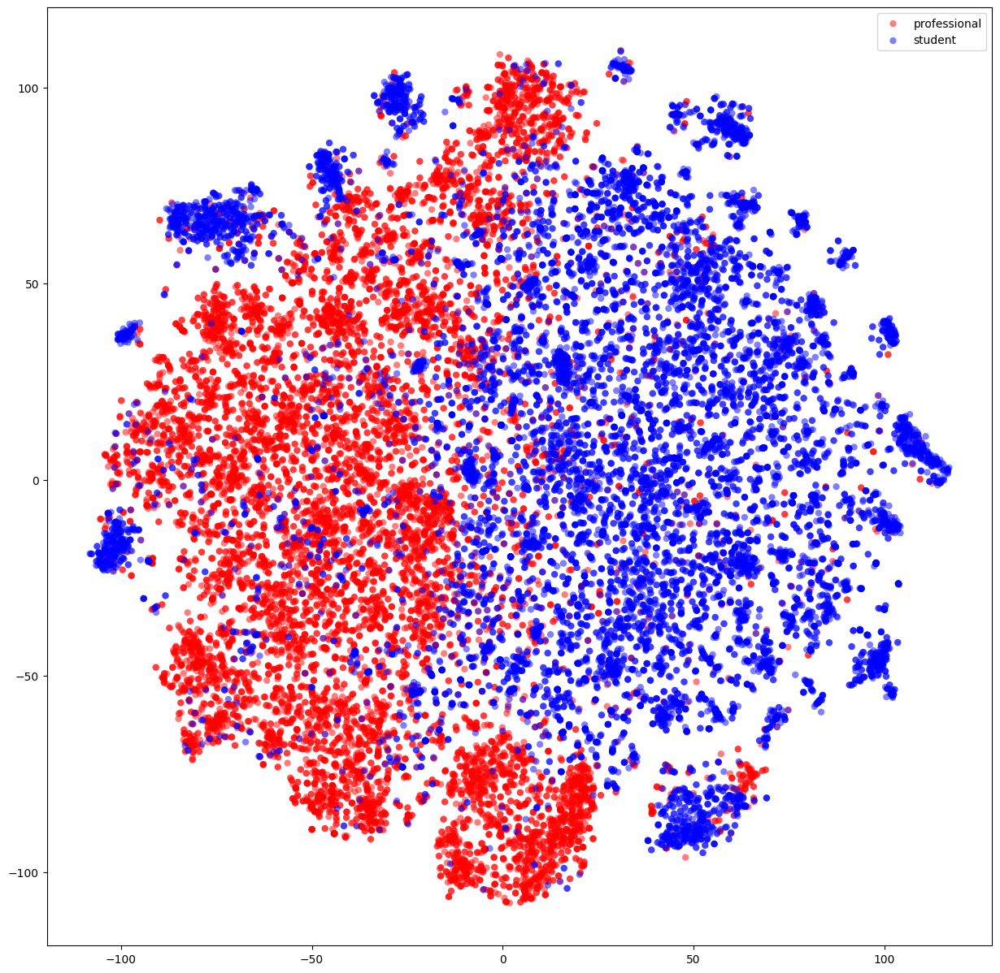

In [47]:
visu_embeddings(usr_tsne_emb, usr_tsne_lab)


# **5. Conclusiones**

Los datos de CarrerVillage contienen bastantes entidades y diferentes tipos de conexiones entre ellos. El objetivo de este notebook ha sido analizar la data solamente desde la estructura de red.

Hemos separado los usuarios en estudiantes y profesionales 

In [48]:
# Separar los embeddings y las etiquetas
embeddings = get_embeddings(n2v_model, nodes_df['id'])

KeyError: "Key '4e5f01128cae4f6d8fd697cec5dca60c' not present"

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Supongamos que tienes un array 'embeddings' con tus embeddings de Node2Vec
inertias = []
k_options = range(1, 20)  # Puedes elegir el rango que creas más conveniente

for k in k_options:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(embeddings)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(k_options, inertias, '-o')
plt.xlabel('Número de clusters k')
plt.ylabel('Inercia')
plt.title('Método del Codo mostrando la inercia óptima por k')
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.cluster import KMeans

# Supongamos que tienes un DataFrame 'nodes_df' con una columna 'label' que contiene las etiquetas para la clasificación
# Las etiquetas podrían ser, por ejemplo, si un profesional pertenece a una cierta industria, o si un estudiante está interesado en un campo específico

# Separar los embeddings y las etiquetas
embeddings = get_embeddings(n2v_model, nodes_df['id'])
kmeans = KMeans(n_clusters=10, random_state=42)  # Elige el número de clusters apropiado
clusters = kmeans.fit_predict(embeddings)

# Ahora 'clusters' contiene una etiqueta de cluster para cada nodo en tu grafo
nodes_df['label'] = clusters
labels = nodes_df['label']  # Asegúrate de tener esta columna de etiquetas en tu DataFrame

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(embeddings, labels, test_size=0.2, random_state=42)

# Entrenar un clasificador de bosque aleatorio
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = clf.predict(X_test)

# Evaluar el modelo
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))

In [50]:
for node_id in nodes_df['id']:
    if node_id not in n2v_model.wv.key_to_index:
        print(f"Node ID {node_id} is not in the Node2Vec model.")

Node ID 4e5f01128cae4f6d8fd697cec5dca60c is not in the Node2Vec model.
Node ID ada720538c014e9b8a6dceed09385ee3 is not in the Node2Vec model.
Node ID eaa66ef919bc408ab5296237440e323f is not in the Node2Vec model.
Node ID 1a6b3749d391486c9e371fbd1e605014 is not in the Node2Vec model.
Node ID 5229c514000446d582050f89ebd4e184 is not in the Node2Vec model.
Node ID 5f62fadae80748c7907e3b0551bf4203 is not in the Node2Vec model.
Node ID 1d804b3b9e764cdd90195fb138d1a5aa is not in the Node2Vec model.
Node ID 08d3cf6fa20543ddbdc42f70a7bcae9e is not in the Node2Vec model.
Node ID 9d33d099a03c44328fbf166aad585f63 is not in the Node2Vec model.
Node ID 228e5feefb4e42188b7c48a5c7eb3aa8 is not in the Node2Vec model.
Node ID 06d99c4fb2bd4104bc7c74b4962aff01 is not in the Node2Vec model.
Node ID f3519ab99a1a4a13a8a9ecb814287d2a is not in the Node2Vec model.
Node ID 3613e323d81e4e35a7c4d99adadc60f2 is not in the Node2Vec model.
Node ID ff2b4495db684ca3b0961cff81cd2376 is not in the Node2Vec model.
Node I

In [51]:
def get_embeddings(model, nodes):
    """Extract representations from the node2vec model and handle unknown nodes."""
    # Calcula el vector promedio
    avg_vector = np.mean(model.wv.vectors, axis=0)
    embeddings = []
    
    for node in nodes:
        if node in model.wv.key_to_index:
            embeddings.append(model.wv.get_vector(node))
        else:
            # Si el nodo no está en el modelo, usa el vector promedio
            embeddings.append(avg_vector)
            
    embeddings = np.array(embeddings)
    return embeddings

/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The defa

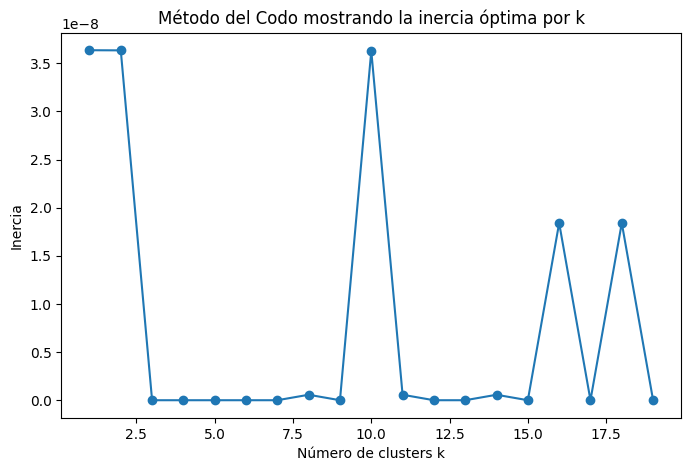

/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34836

    accuracy                           1.00     34836
   macro avg       1.00      1.00      1.00     34836
weighted avg       1.00      1.00      1.00     34836

Accuracy: 1.0


In [53]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Suponiendo que la función 'get_embeddings' está definida y que 'nodes_df' es tu DataFrame de nodos
# Suponiendo que 'n2v_model' es tu modelo Node2Vec entrenado

# Obtener los embeddings de Node2Vec
embeddings = get_embeddings(n2v_model, nodes_df['id'])

# Método del codo para determinar el número óptimo de clusters
inertias = []
k_options = range(1, 20)  # Puedes ajustar este rango según sea necesario

for k in k_options:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(embeddings)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(k_options, inertias, '-o')
plt.xlabel('Número de clusters k')
plt.ylabel('Inercia')
plt.title('Método del Codo mostrando la inercia óptima por k')
plt.show()

# Selecciona el valor de k donde se observa el 'codo' en la gráfica
optimal_k = int(input("Introduce el número óptimo de clusters según el método del codo: "))

# Ejecutar K-means con el número óptimo de clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(embeddings)

# Agregar las etiquetas de clusters al DataFrame
nodes_df['label'] = clusters

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(embeddings, nodes_df['label'], test_size=0.2, random_state=42)

# Entrenar un clasificador de bosque aleatorio
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = clf.predict(X_test)

# Evaluar el modelo
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))


In [54]:
print(nodes_df['label'].value_counts())

label
0    174180
Name: count, dtype: int64


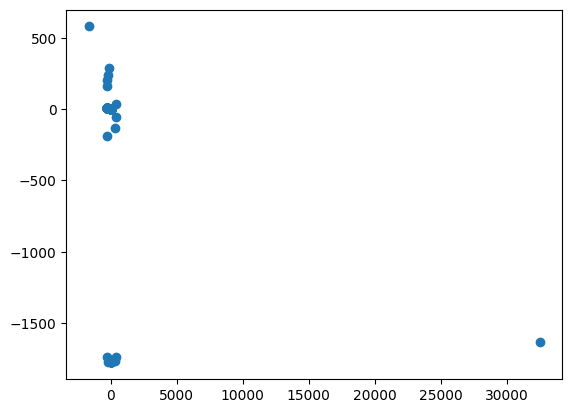

/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/egoitzaulestiapadilla/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [55]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Obtén los embeddings
embeddings = get_embeddings(n2v_model, nodes_df['id'])

# Visualizar los embeddings usando t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1])
plt.show()

# Probar diferentes números de clusters con K-means
for k in range(2, 10):  # Ajusta este rango según sea necesario
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(embeddings)
    silhouette = silhouette_score(embeddings, labels)
    print(f'Número de Clusters: {k}, Silhouette Score: {silhouette}')

# Considera usar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Ajusta estos parámetros
dbscan_labels = dbscan.fit_predict(embeddings)

# Visualizar los resultados de DBSCAN
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=dbscan_labels)
plt.show()

# Usar las etiquetas del método que mejor funcione
# Por ejemplo, si DBSCAN funciona mejor, usa dbscan_labels como tus etiquetas finales
nodes_df['label'] = dbscan_labels  # o usa labels de K-means si eso funciona mejor
